In [2]:
# Import packages here
import numpy as np
import xarray as xr
import pandas as pd
import netCDF4 as nc
import cftime

import matplotlib as mpl
import matplotlib.pyplot as plt
import cartopy
from cartopy import config
import cartopy.crs as ccrs

import climlab
from sklearn.linear_model import LinearRegression
import scipy.stats as st
import statsmodels.api as sm
import warnings

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
warnings.filterwarnings('ignore')
%matplotlib inline

/data/keeling/a/tjhanke2/miniconda3/lib/python3.8/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex


In [3]:
# Load all global constants and global functions
%run /data/keeling/a/tjhanke2/enso-energy-budget/Data/get_global_constants.ipynb
%run /data/keeling/a/tjhanke2/enso-energy-budget/Data/get_data_variables_fncs.ipynb

In [4]:
# This area is to be used as the user options section. Determine what needs to be plotted here. 
# 0 = don't plot, 1 = do plot
plot_2d_lr_ceres = 1
plot_zonal_lr_ceres = 1
plot_gm_lr_ceres = 1

plot_2d_lr_clr_sky = 1
plot_zonal_clr_sky = 1
plot_gm_clr_sky = 1

plot_2d_lr_ccf = 1
plot_zonal_lr_ccf = 1
plot_gm_lr_ccf = 1
plot_2d_lr_comb_ccf = 1

In [5]:
# Get CERES data variables
%run ./get_ceres_cre_lr.ipynb

# Get CCF data variables
%run ./get_ccfs_lr.ipynb

No handles with labels found to put in legend.


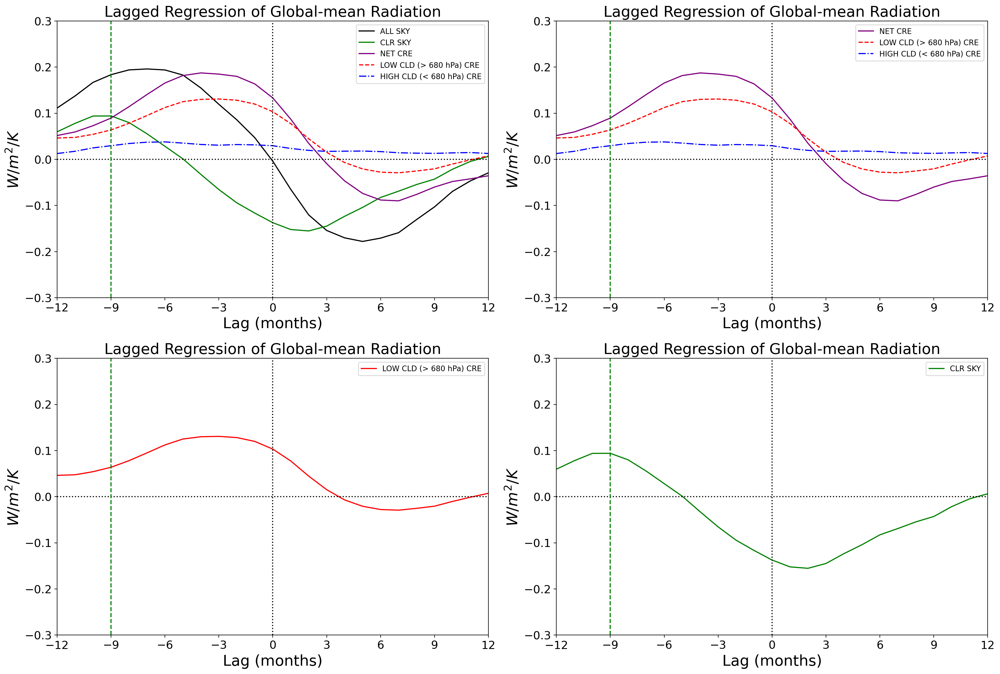

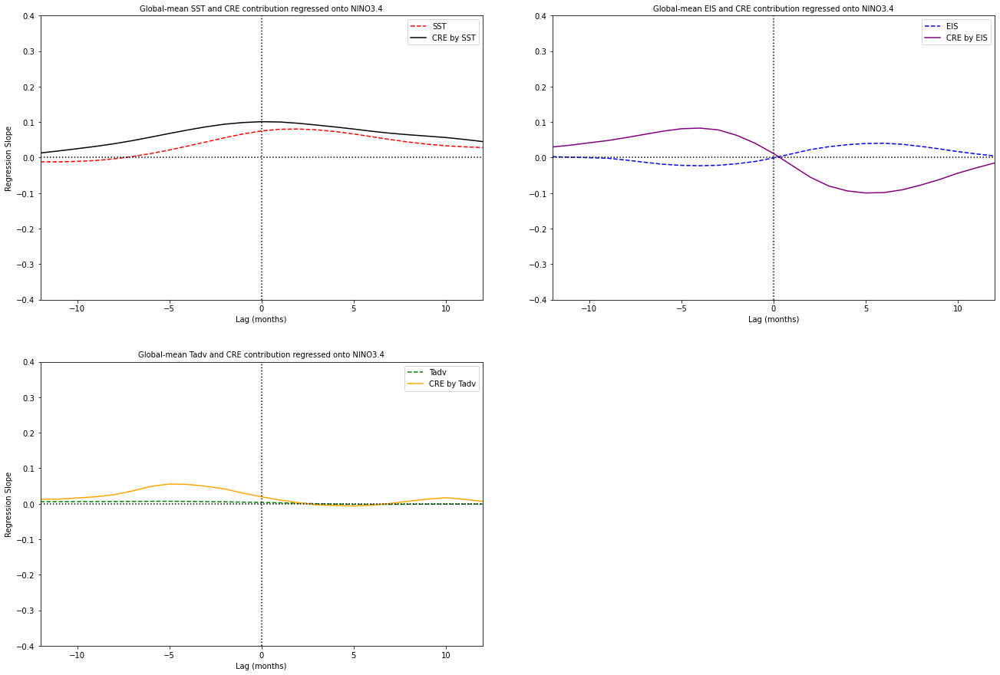

In [12]:
# Get global-mean lagged regression plots FOR CERES EBAF & FBCT
if plot_gm_lr_ceres == 1:
    # Define the lag you want to use here
    lag = range(-12,13)  # [start,end)
    %run ./get_gm_lagged_regress.ipynb
    
    get_gm_lr_plot()

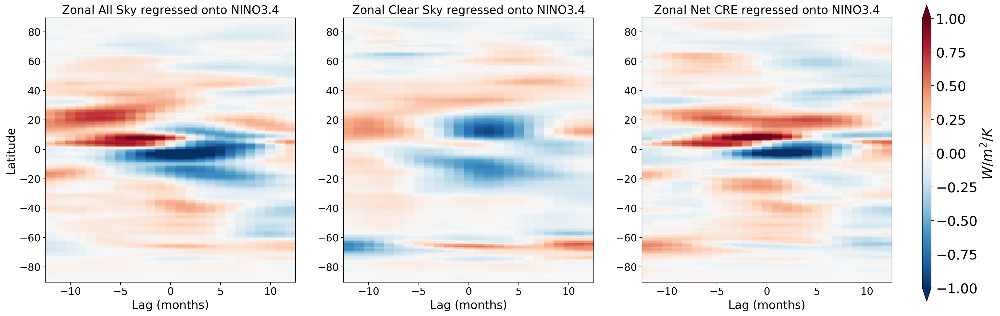

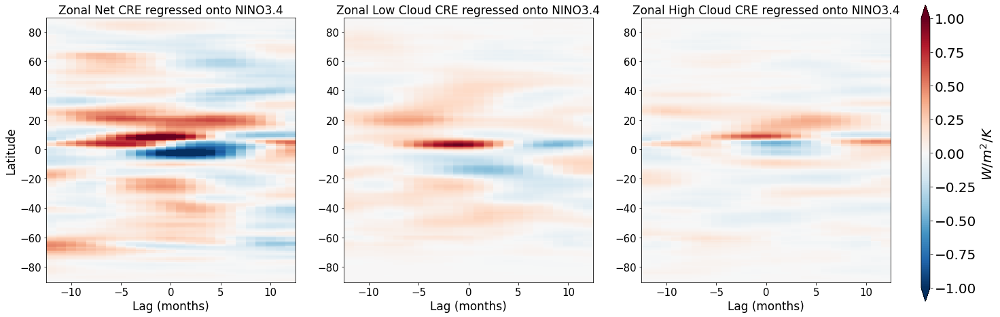

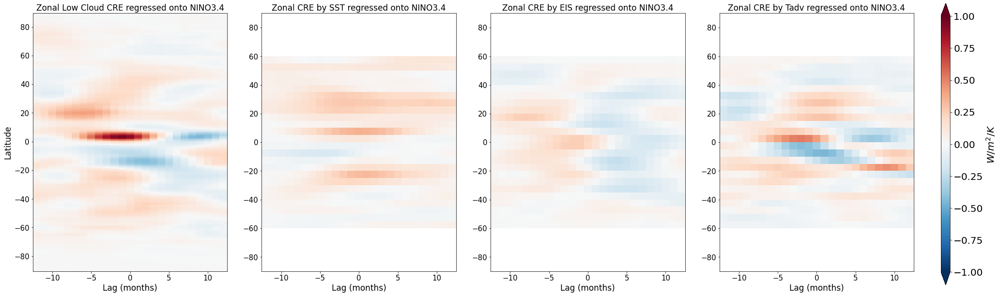

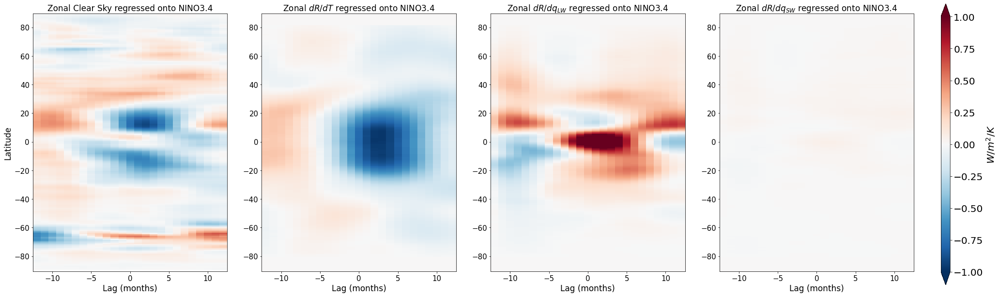

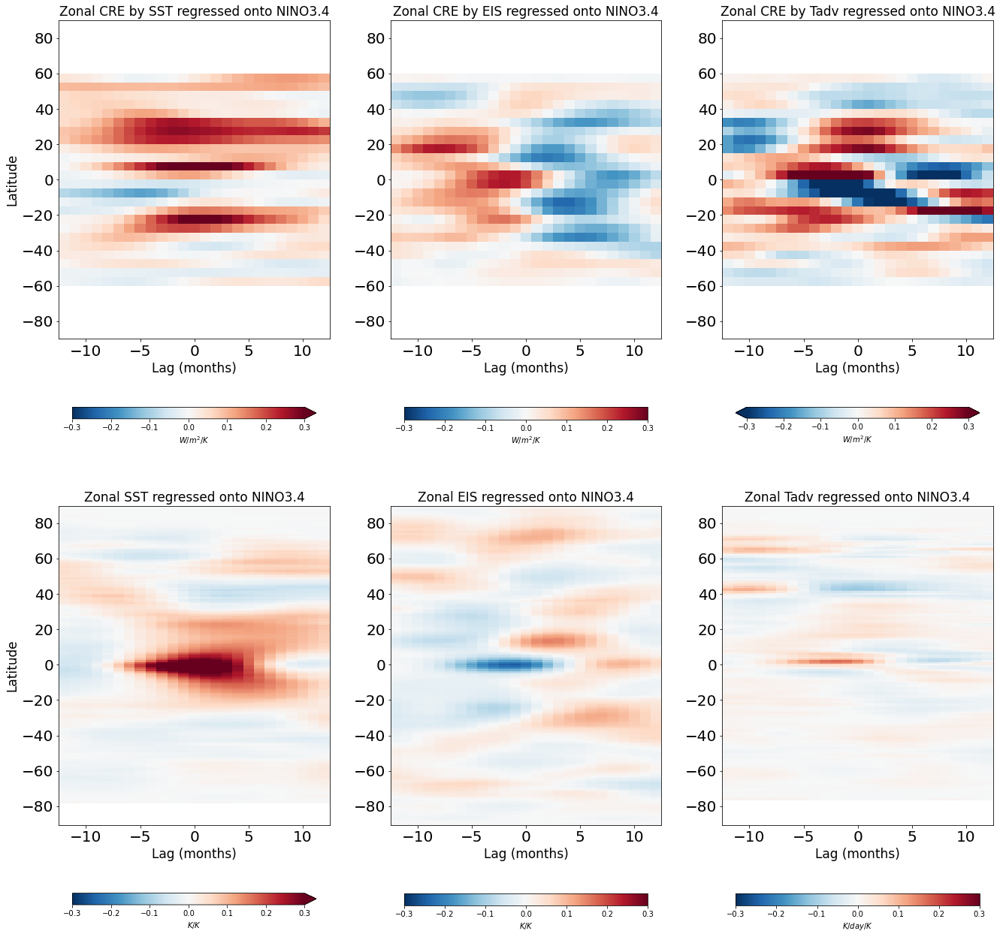

In [10]:
# Get zonal lagged regression plots FOR CERES EBAF & FBCT
if plot_zonal_lr_ceres == 1:
    # Define the lag you want to use here
    lag = range(-12,13)  # [start,end)
    %run ./get_zonal_lagged_regress.ipynb
    
    get_zonal_lr_plot()

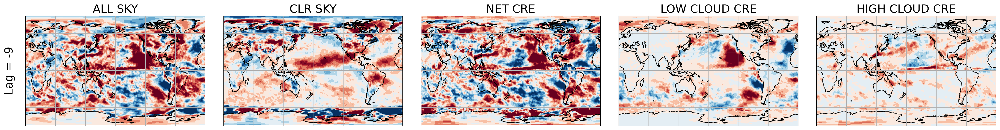

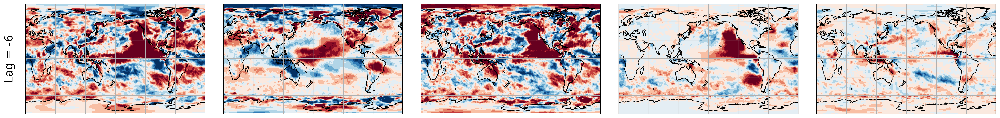

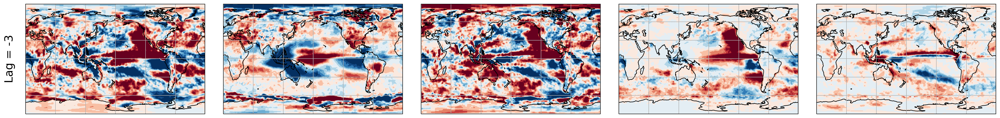

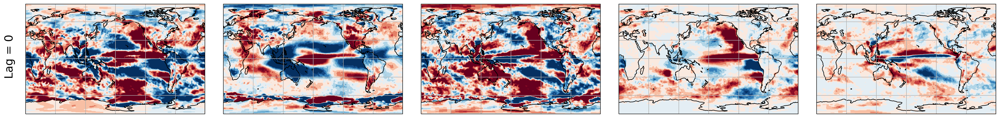

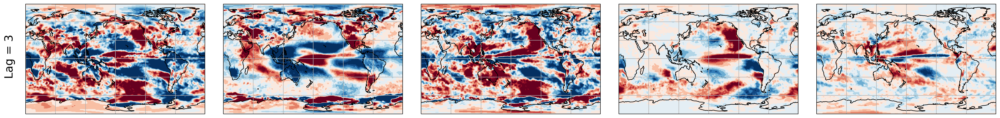

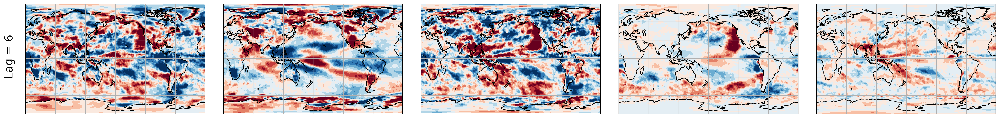

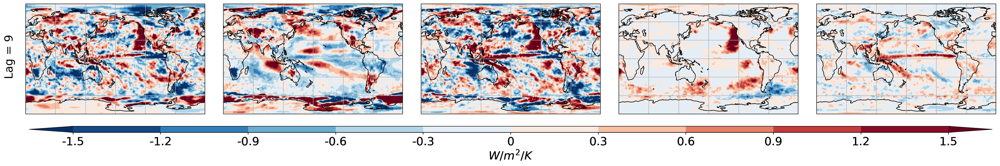

In [8]:
# Get regional lagged regression plots FOR CERES EBAF & FBCT
if plot_2d_lr_ceres == 1:
    # Define the lag you want to use here
    lag_list = np.arange(-9,10,3)
    
    for i in range(0,len(lag_list)):
        lag = lag_list[i]
        %run ./get_2d_lagged_regress_all_sky.ipynb
            
        get_2d_lr_plot_2(lag)

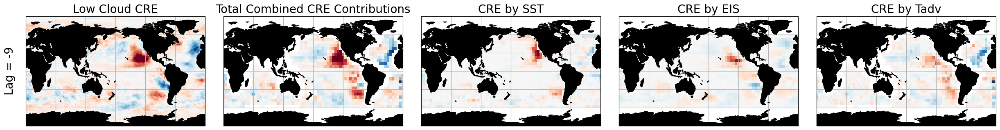

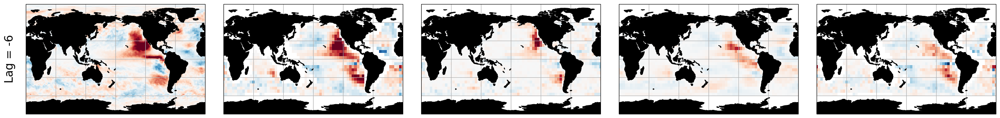

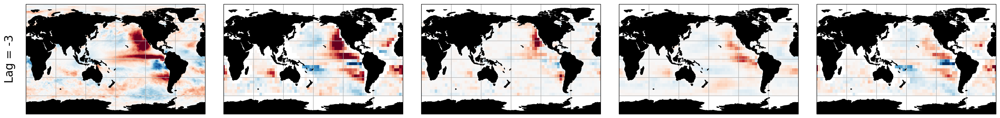

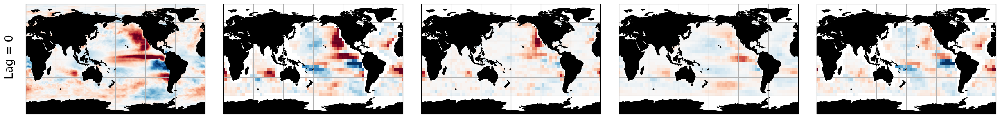

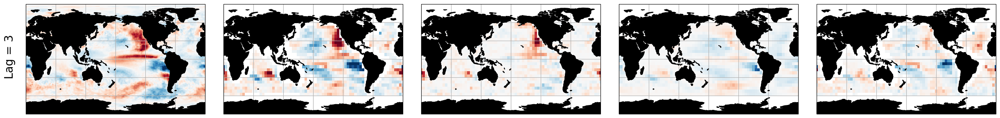

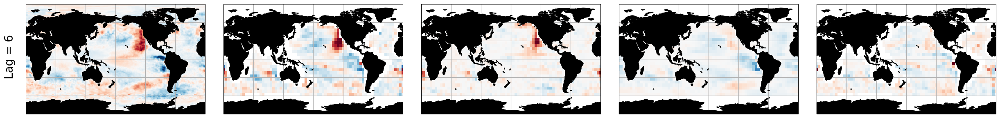

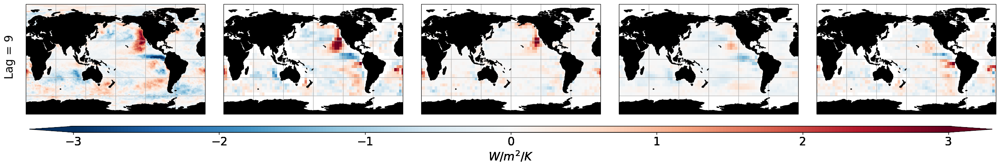

In [13]:
## Get regional lagged regression plots by decomposing low cloud CRE into contributions by CCFs
if plot_2d_lr_ceres == 1:
    # Define the lag you want to use here
    lag_list = np.arange(-9,10,3)
    
    for i in range(0,len(lag_list)):
        lag = lag_list[i]
        %run ./get_2d_lagged_regress_low_cld.ipynb
            
        get_2d_lr_plot_2(lag)

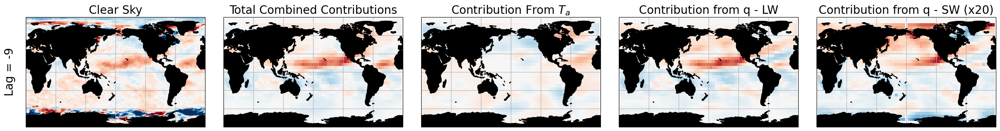

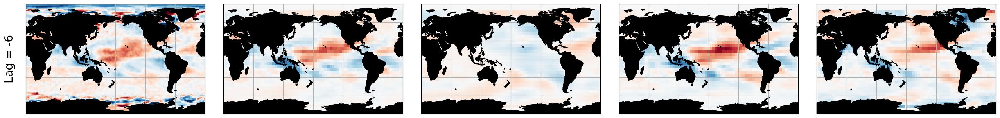

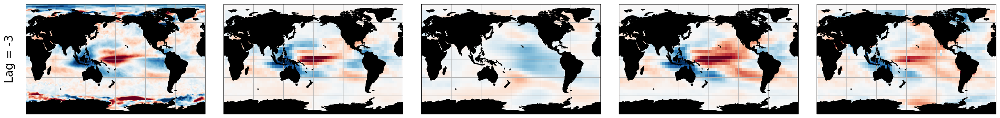

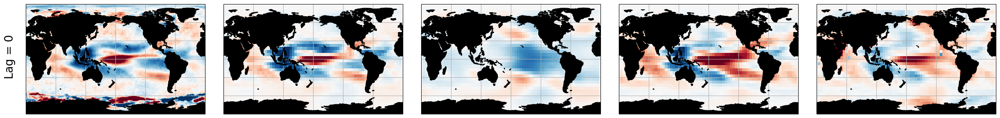

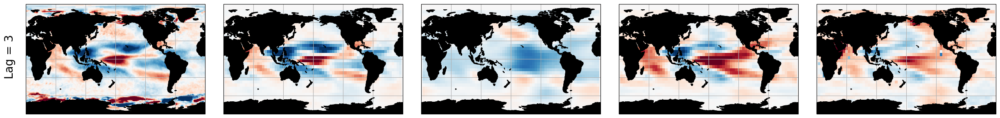

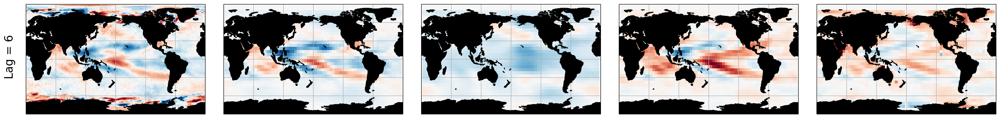

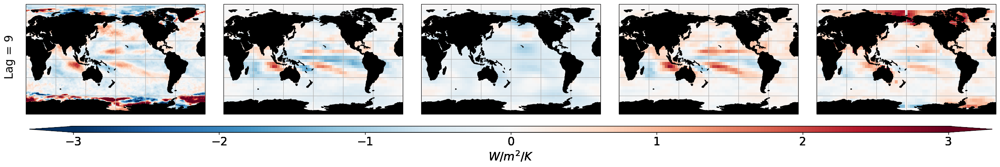

In [16]:
## Get regional lagged regression plots by decomposing CLR SKY into contributions by CLR SKY factors
if plot_2d_lr_ceres == 1:
    # Define the lag you want to use here
    lag_list = np.arange(-9,10,3)
    
    for i in range(0,len(lag_list)):
        lag = lag_list[i]
        %run ./get_2d_lagged_regress_clr_sky_decomp.ipynb
            
        get_2d_lr_plot(lag)

In [12]:
## Compile all regional lagged regression maps into one image
fig, ax = plt.subplots(len(lag_list), 1, figsize=(24,24), dpi=100, gridspec_kw={'height_ratios': [1,1,1,1,1,1,1.4]})
fig.tight_layout(h_pad=-1)

path = '/data/keeling/a/tjhanke2/enso-energy-budget/Output/Plots/linear_regression/'

img1 = plt.imread(path + 'radiation_regress_lag_-9_all_mon.png')
img2 = plt.imread(path + 'radiation_regress_lag_-6_all_mon.png')
img3 = plt.imread(path + 'radiation_regress_lag_-3_all_mon.png')
img4 = plt.imread(path + 'radiation_regress_lag_0_all_mon.png')
img5 = plt.imread(path + 'radiation_regress_lag_3_all_mon.png')
img6 = plt.imread(path + 'radiation_regress_lag_6_all_mon.png')
img7 = plt.imread(path + 'radiation_regress_lag_9_all_mon.png')

ax[0].imshow(img1, aspect='auto')
ax[1].imshow(img2, aspect='auto')
ax[2].imshow(img3, aspect='auto')
ax[3].imshow(img4, aspect='auto')
ax[4].imshow(img5, aspect='auto')
ax[5].imshow(img6, aspect='auto')
ax[6].imshow(img7, aspect='auto')

for i in range(0, len(lag_list)):
    ax[i].axis('off')

fig.savefig(path + 'radiation_regress_all_sky_all_lags.png')
plt.close()

In [21]:
## Compile all regional CCF CRE lagged regression maps into one image
fig, ax = plt.subplots(len(lag_list), 1, figsize=(24,24), dpi=100, gridspec_kw={'height_ratios': [1,1,1,1,1,1,1.4]})
fig.tight_layout(h_pad=-1)

path = '/data/keeling/a/tjhanke2/enso-energy-budget/Output/Plots/linear_regression/'

img1 = plt.imread(path + 'radiation_regress_lag_-9_loCld_mon.png')
img2 = plt.imread(path + 'radiation_regress_lag_-6_loCld_mon.png')
img3 = plt.imread(path + 'radiation_regress_lag_-3_loCld_mon.png')
img4 = plt.imread(path + 'radiation_regress_lag_0_loCld_mon.png')
img5 = plt.imread(path + 'radiation_regress_lag_3_loCld_mon.png')
img6 = plt.imread(path + 'radiation_regress_lag_6_loCld_mon.png')
img7 = plt.imread(path + 'radiation_regress_lag_9_loCld_mon.png')

ax[0].imshow(img1, aspect='auto')
ax[1].imshow(img2, aspect='auto')
ax[2].imshow(img3, aspect='auto')
ax[3].imshow(img4, aspect='auto')
ax[4].imshow(img5, aspect='auto')
ax[5].imshow(img6, aspect='auto')
ax[6].imshow(img7, aspect='auto')

for i in range(0, len(lag_list)):
    ax[i].axis('off')
    
fig.savefig(path + 'radiation_regress_loCld_all_lags.png')
plt.close()

In [22]:
## Compile all regional CLR SKY factor lagged regression maps into one image
fig, ax = plt.subplots(len(lag_list), 1, figsize=(24,24), dpi=100, gridspec_kw={'height_ratios': [1,1,1,1,1,1,1.4]})
fig.tight_layout(h_pad=-1)

path = '/data/keeling/a/tjhanke2/enso-energy-budget/Output/Plots/linear_regression/'

img1 = plt.imread(path + 'radiation_regress_lag_-9_mon_clr_sky_decomp.png')
img2 = plt.imread(path + 'radiation_regress_lag_-6_mon_clr_sky_decomp.png')
img3 = plt.imread(path + 'radiation_regress_lag_-3_mon_clr_sky_decomp.png')
img4 = plt.imread(path + 'radiation_regress_lag_0_mon_clr_sky_decomp.png')
img5 = plt.imread(path + 'radiation_regress_lag_3_mon_clr_sky_decomp.png')
img6 = plt.imread(path + 'radiation_regress_lag_6_mon_clr_sky_decomp.png')
img7 = plt.imread(path + 'radiation_regress_lag_9_mon_clr_sky_decomp.png')

ax[0].imshow(img1, aspect='auto')
ax[1].imshow(img2, aspect='auto')
ax[2].imshow(img3, aspect='auto')
ax[3].imshow(img4, aspect='auto')
ax[4].imshow(img5, aspect='auto')
ax[5].imshow(img6, aspect='auto')
ax[6].imshow(img7, aspect='auto')

for i in range(0, len(lag_list)):
    ax[i].axis('off')

fig.savefig(path + 'lagged_regress_clr_sky_decomp_all_lags.png')
plt.close()

In [23]:
## Compile all regional CCF lagged regression maps into one image
fig, ax = plt.subplots(len(lag_list), 1, figsize=(24,24), dpi=100, gridspec_kw={'height_ratios': [1,1,1,1,1,1,1.4]})
fig.tight_layout(h_pad=-1)

path = '/data/keeling/a/tjhanke2/enso-energy-budget/Output/Plots/linear_regression/'

img1 = plt.imread(path + 'radiation_regress_lag_-9_mon_ccf.png')
img2 = plt.imread(path + 'radiation_regress_lag_-6_mon_ccf.png')
img3 = plt.imread(path + 'radiation_regress_lag_-3_mon_ccf.png')
img4 = plt.imread(path + 'radiation_regress_lag_0_mon_ccf.png')
img5 = plt.imread(path + 'radiation_regress_lag_3_mon_ccf.png')
img6 = plt.imread(path + 'radiation_regress_lag_6_mon_ccf.png')
img7 = plt.imread(path + 'radiation_regress_lag_9_mon_ccf.png')

ax[0].imshow(img1, aspect='auto')
ax[1].imshow(img2, aspect='auto')
ax[2].imshow(img3, aspect='auto')
ax[3].imshow(img4, aspect='auto')
ax[4].imshow(img5, aspect='auto')
ax[5].imshow(img6, aspect='auto')
ax[6].imshow(img7, aspect='auto')

for i in range(0, len(lag_list)):
    ax[i].axis('off')
    
fig.savefig(path + 'radiation_regress_ccf_all_lags.png')
plt.close()